In [1]:
import scanpy as sc
import os
import bin2cell as b2c
import celltypist
from celltypist import models
import numpy as np
from matplotlib import rcParams
from matplotlib import font_manager
import matplotlib.pyplot as plt
rcParams['pdf.fonttype'] = 42
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 150, vector_friendly = True, format = 'pdf')
font_manager.fontManager.addfont(".../Arial.ttf")
print(font_manager.findfont("Arial"))
plt.rcParams["font.sans-serif"] = ["Arial"]
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 300, vector_friendly = True, format = 'pdf')

/nfs/team205/ny1/ThymusSpatialAtlas/software/Arial.ttf


This notebook will compare the Bin2cell segmentation (he or gex) object with the default 10X 8um binned outputs .


In [2]:
path008 = ".../square_008um/"
path002 = ".../square_002um/"
source_image_path = ".../Visium_HD_Human_Colon_Cancer_tissue_image.btf"

# Load 8um default object 

Loading the count matrix currently requires a bespoke loader function as 10X have moved the spot coordinates into a Parquet file. The required syntax changes have been [offered to Scanpy](https://github.com/scverse/scanpy/pull/2992) so hopefully just using Scanpy's default loader will be sufficient soon.

In [3]:
bdata = b2c.read_visium(path008, source_image_path = source_image_path)
bdata.var_names_make_unique()

In [4]:
bdata.raw = bdata.copy()

## Some filtering

Let's slightly filter the object - require the genes to show up in three spots, and require the spots to have any information at all (the data is extremely sparse at this stage).

In [5]:
sc.pp.filter_genes(bdata, min_cells=3)
sc.pp.filter_cells(bdata, min_genes=100)
sc.pp.calculate_qc_metrics(bdata,inplace=True)

Let's remove some bins that have very low gene coverage 

In [6]:
sc.pp.highly_variable_genes(bdata,n_top_genes=5000,flavor="seurat_v3")
sc.pp.normalize_total(bdata,target_sum=1e4)
sc.pp.log1p(bdata)

# Predict cell types

In [7]:
predictions_8bin_crc = celltypist.annotate(bdata, model = 'Human_Colorectal_Cancer.pkl', majority_voting = False)

🔬 Input data has 419309 cells and 18058 genes
🔗 Matching reference genes in the model
🧬 3733 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


In [8]:
# add the colorectal cancer model
bdata = predictions_8bin_crc.to_adata()


In [9]:
sc.pp.scale(bdata, max_value=10)
sc.pp.pca(bdata, use_highly_variable=True)
sc.pp.neighbors(bdata)
sc.tl.umap(bdata)

2024-09-25 12:08:33.797093: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-09-25 12:08:35.446334: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-09-25 12:08:39.640131: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-09-25 12:09:04.290948: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


... storing 'feature_types' as categorical
... storing 'genome' as categorical


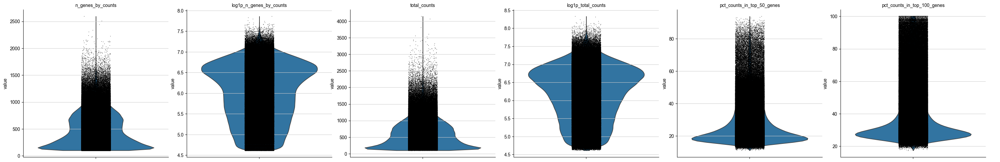

In [10]:
sc.set_figure_params(dpi=50,fontsize=10,)
sc.pl.violin(bdata, ['n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes'],
             jitter=0.1, multi_panel=True)

we are left with 420K potential spots in let's see how this looks in terms of UMAP embeddings

## estimate embedding

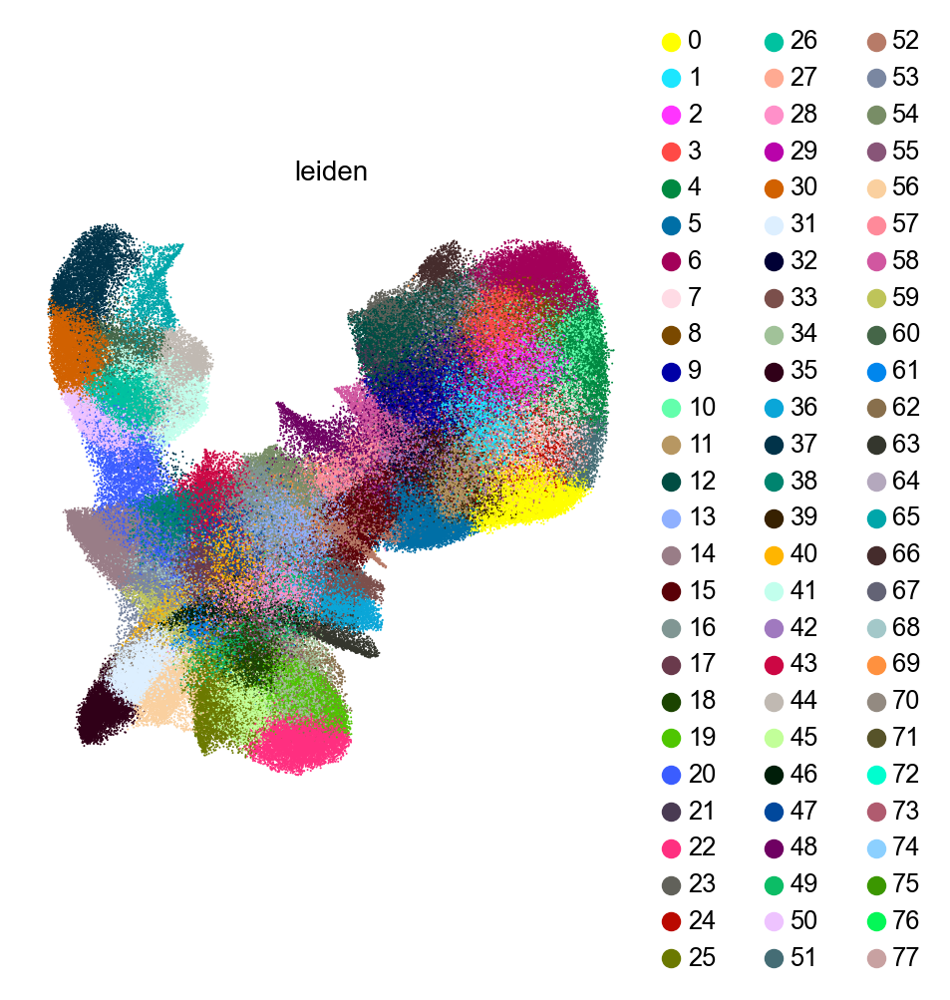

In [11]:
sc.set_figure_params(dpi=100,fontsize=10,)
os.chdir('.../')
sc.tl.leiden(bdata,resolution=6,key_added='leiden')
sc.pl.umap(bdata,color=['leiden'],size=2,wspace=0.25,frameon=False)

# recover raw reads and save 

In [12]:
bdata.raw.to_adata().write('.../crc_8um_public.h5ad')

... storing 'feature_types' as categorical
... storing 'genome' as categorical


# b2c he + salvage object 

The notebook is causal, the numbering is not sequential as some of the processing (Leiden clustering in particular) is rather resource intensive and was ran/saved as resources permitted

In [22]:
cdata = sc.read_h5ad(path002+'b2c_crc.h5ad')
cdata.var_names_make_unique()
cdata = cdata[cdata.obs['bin_count']>5] # min 6 bins
#need integers for seuratv3 hvgs
cdata.X.data = np.round(cdata.X.data)
cdata.raw = cdata.copy()

In [23]:
sc.pp.filter_genes(cdata, min_cells=3)
sc.pp.filter_cells(cdata,min_genes=100)
sc.pp.calculate_qc_metrics(cdata,inplace=True)

In [24]:
sc.pp.highly_variable_genes(cdata,n_top_genes=5000,flavor="seurat_v3")
sc.pp.normalize_total(cdata,target_sum=1e4)
sc.pp.log1p(cdata)

# Predict cell types

In [25]:
predictions_b2c_crc = celltypist.annotate(cdata, model = 'Human_Colorectal_Cancer.pkl', majority_voting = False)

🔬 Input data has 235474 cells and 18057 genes
🔗 Matching reference genes in the model
🧬 3733 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!


In [26]:
# add the colorectal cancer model
cdata = predictions_b2c_crc.to_adata()

In [27]:
cdata = cdata[:, cdata.var["highly_variable"]]
sc.pp.scale(cdata, max_value=10)
sc.pp.pca(cdata, use_highly_variable=True)
sc.pp.neighbors(cdata)
sc.tl.umap(cdata)

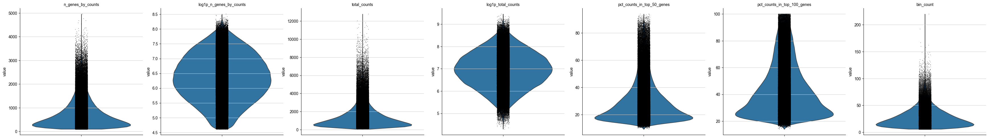

In [28]:
sc.set_figure_params(dpi=50,fontsize=10,)
sc.pl.violin(cdata, ['n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes','bin_count'],
             jitter=0.05, multi_panel=True)

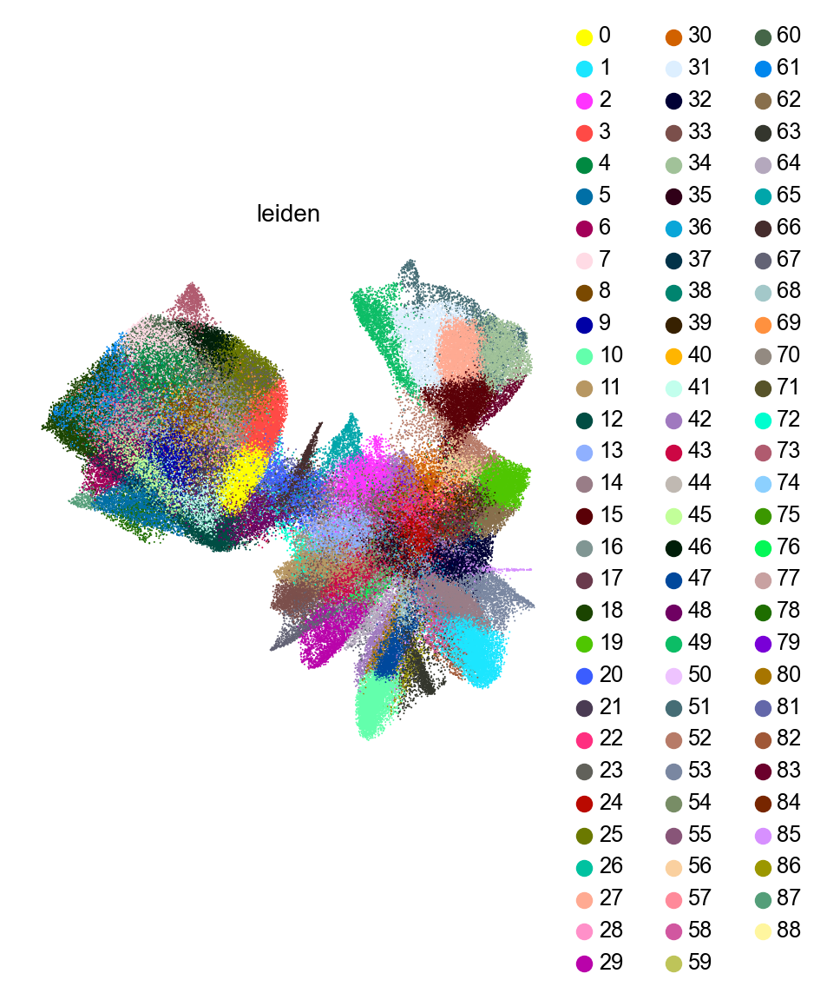

In [29]:
sc.set_figure_params(dpi=100,fontsize=10,)
os.chdir('.../')
sc.tl.leiden(cdata,resolution=6,key_added='leiden')
sc.pl.umap(cdata,color=['leiden'],size=2,wspace=0.25,frameon=False)

# recover raw reads and save 

In [30]:
cdata.raw.to_adata().write('.../crc_b2c_public.h5ad')

# load objects

In [3]:
bdata = sc.read_h5ad('.../crc_8um_public.h5ad')
cdata = sc.read_h5ad('.../crc_b2c_public.h5ad')

In [4]:
bdata

AnnData object with n_obs × n_vars = 419309 × 18085
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'predicted_labels', 'conf_score', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'spatial', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    obsp: 'connectivities', 'distances'

In [5]:
cdata

AnnData object with n_obs × n_vars = 235474 × 18058
    obs: 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'predicted_labels', 'conf_score', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'spatial', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_cropped'
    obsp: 'connectivities', 'distances'

In [6]:
# # asses corespondance beteeen leiden clusters to cell types
from sklearn.metrics import homogeneity_score
print('8um homogeneity score - '+str(homogeneity_score(bdata.obs['leiden'],bdata.obs['predicted_labels'])))
print('b2c homogeneity score - '+str(homogeneity_score(cdata.obs['leiden'],cdata.obs['predicted_labels'])))

8um homogeneity score - 0.17475191434042003
b2c homogeneity score - 0.18998129251164828


# plotting 

In [10]:
os.chdir('.../')

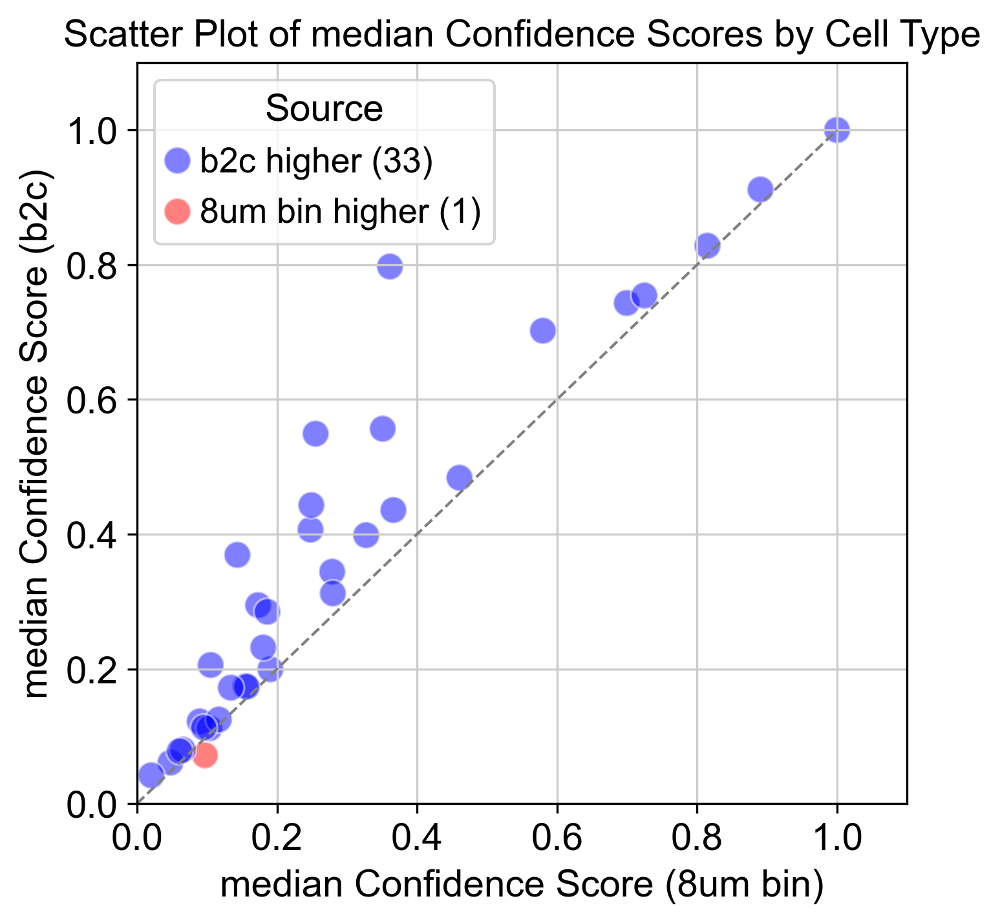

In [11]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the median confidence score for each cell type in bdata
bdata_medians = bdata.obs.groupby('predicted_labels')['conf_score'].median().reset_index(name='median_conf_score')
bdata_medians.set_index('predicted_labels', inplace=True)
bdata_medians['Source'] = '8um bin'
bdata_medians['counts'] = bdata.obs.groupby('predicted_labels')['conf_score'].count()

# Calculate the median confidence score for each cell type in cdata
cdata_medians = cdata.obs.groupby('predicted_labels')['conf_score'].median().reset_index(name='median_conf_score')
cdata_medians.set_index('predicted_labels', inplace=True)
cdata_medians['Source'] = 'b2c'
cdata_medians['counts'] = cdata.obs.groupby('predicted_labels')['conf_score'].count()

# Combine the results from all datasets
combined_medians = pd.concat([cdata_medians, bdata_medians], axis=1, keys=['b2c', '8um bin'])
combined_medians.columns = ['_'.join(col).strip() for col in combined_medians.columns.values]

# Calculate the maximum confidence score for each cell type across conditions
max_conf_scores = combined_medians[['b2c_median_conf_score', '8um bin_median_conf_score']].max(axis=1)
max_counts = combined_medians[['b2c_counts', '8um bin_counts']].max(axis=1)

# Filter out cell types with a maximum confidence score lower than 0.01
cell_types_to_keep = max_conf_scores[max_conf_scores >= 0.01].index
cell_types_to_keep2 = max_counts[max_counts >= 50].index

combined_medians_filtered = combined_medians.loc[combined_medians.index.isin(cell_types_to_keep)]
combined_medians_filtered = combined_medians_filtered.loc[combined_medians_filtered.index.isin(cell_types_to_keep2)]

# Determine the color based on which condition has the higher median confidence score
combined_medians_filtered['color'] = combined_medians_filtered.apply(
    lambda row: 'red' if row['8um bin_median_conf_score'] > row['b2c_median_conf_score'] else 'blue', axis=1)

# Count the number of categories higher in each condition
higher_in_8um = sum(combined_medians_filtered['color'] == 'red')
higher_in_b2c = sum(combined_medians_filtered['color'] == 'blue')

# Create a scatter plot to visualize the data
plt.figure(figsize=(5, 5))  # Adjust figure size as needed
ax = sns.scatterplot(data=combined_medians_filtered, 
                     x='8um bin_median_conf_score', y='b2c_median_conf_score', 
                     s=100, hue='color', palette={'red': 'red', 'blue': 'blue'}, alpha=0.5)

# Add a diagonal line for reference
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', linewidth=1)

# Restrict x and y axes to the relevant values
plt.xlim(0, combined_medians_filtered['8um bin_median_conf_score'].max() + 0.1)
plt.ylim(0, combined_medians_filtered['b2c_median_conf_score'].max() + 0.1)

# Add custom legend
handles, labels = ax.get_legend_handles_labels()
labels = [f'b2c higher ({higher_in_b2c})',f'8um bin higher ({higher_in_8um})']
ax.legend(handles=handles, labels=labels, title='Source')

plt.title('Scatter Plot of median Confidence Scores by Cell Type')
plt.xlabel('median Confidence Score (8um bin)')
plt.ylabel('median Confidence Score (b2c)')
plt.tight_layout()
# plt.savefig('.../figures/predictions_scatter_colored.pdf')
plt.show()
# combined_medians_filtered.to_csv('.../combined_medians_filtered_conf_score.csv')

1328381854.py (31): 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


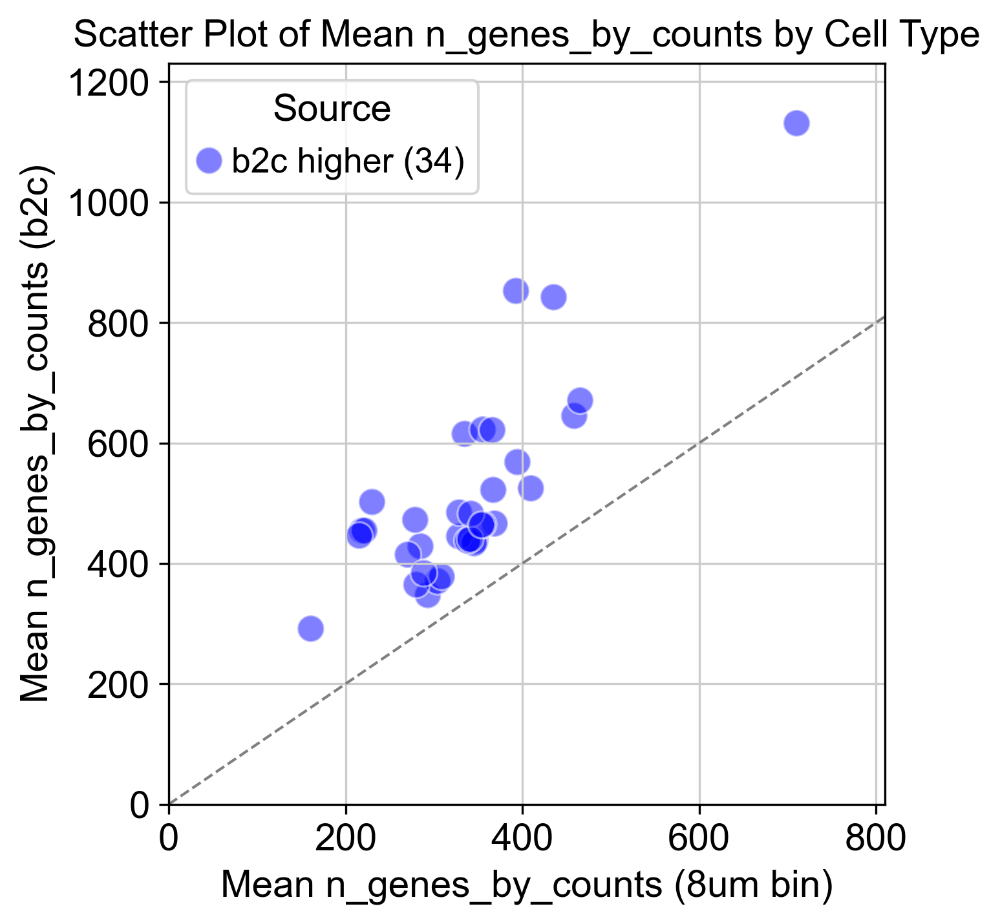

In [12]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the mean of n_genes_by_counts for each cell type in bdata
bdata_means = bdata.obs.groupby('predicted_labels')['n_genes_by_counts'].mean().reset_index(name='mean_n_genes_by_counts')
bdata_means.set_index('predicted_labels', inplace=True)
bdata_means['Source'] = '8um bin'
bdata_means['counts'] = bdata.obs.groupby('predicted_labels')['n_genes_by_counts'].count()

# Calculate the mean of n_genes_by_counts for each cell type in cdata
cdata_means = cdata.obs.groupby('predicted_labels')['n_genes_by_counts'].mean().reset_index(name='mean_n_genes_by_counts')
cdata_means.set_index('predicted_labels', inplace=True)
cdata_means['Source'] = 'b2c'
cdata_means['counts'] = cdata.obs.groupby('predicted_labels')['n_genes_by_counts'].count()

# Combine the results from all datasets
combined_means = pd.concat([cdata_means, bdata_means], axis=1, keys=['b2c', '8um bin'])
combined_means.columns = ['_'.join(col).strip() for col in combined_means.columns.values]

# Calculate the maximum n_genes_by_counts for each cell type across conditions
max_n_genes_by_counts = combined_means[['b2c_mean_n_genes_by_counts', '8um bin_mean_n_genes_by_counts']].max(axis=1)
max_counts = combined_means[['b2c_counts', '8um bin_counts']].max(axis=1)

# Filter out cell types with a maximum n_genes_by_counts lower than 0.1
cell_types_to_keep = max_counts[max_counts >= 50].index

combined_means_filtered = combined_means.loc[combined_means.index.isin(cell_types_to_keep)]

# Determine the color based on which condition has the higher mean n_genes_by_counts
combined_means_filtered['color'] = combined_means_filtered.apply(
    lambda row: 'red' if row['8um bin_mean_n_genes_by_counts'] > row['b2c_mean_n_genes_by_counts'] else 'blue', axis=1)

# Count the number of categories higher in each condition
higher_in_8um = sum(combined_means_filtered['color'] == 'red')
higher_in_b2c = sum(combined_means_filtered['color'] == 'blue')

# Create a scatter plot to visualize the data
plt.figure(figsize=(5, 5))  # Adjust figure size as needed
ax = sns.scatterplot(data=combined_means_filtered, 
                     x='8um bin_mean_n_genes_by_counts', y='b2c_mean_n_genes_by_counts', 
                     s=100, hue='color', palette={'red': 'red', 'blue': 'blue'}, alpha=0.5)

# Add a diagonal line for reference
max_val = max(combined_means_filtered['8um bin_mean_n_genes_by_counts'].max(), combined_means_filtered['b2c_mean_n_genes_by_counts'].max()) + 100
plt.plot([0, max_val], [0, max_val], linestyle='--', color='gray', linewidth=1)

# Restrict x and y axes to the relevant values
plt.xlim(0, combined_means_filtered['8um bin_mean_n_genes_by_counts'].max() + 100)
plt.ylim(0, combined_means_filtered['b2c_mean_n_genes_by_counts'].max() + 100)

# Add custom legend
handles, labels = ax.get_legend_handles_labels()
labels = [ f'b2c higher ({higher_in_b2c})',f'8um bin higher ({higher_in_8um})']
ax.legend(handles=handles, labels=labels, title='Source')

plt.title('Scatter Plot of Mean n_genes_by_counts by Cell Type')
plt.xlabel('Mean n_genes_by_counts (8um bin)')
plt.ylabel('Mean n_genes_by_counts (b2c)')
plt.tight_layout()
# plt.savefig('.../figures/n_genes_scatter_8um_vs_b2c.pdf')
plt.show()
# combined_means_filtered.to_csv('.../combined_means_filtered_n_genes.csv')

In [13]:
bdata.write_h5ad('.../crc_8um_anno_public.h5ad')
cdata.write_h5ad('.../crc_b2c_anno_public.h5ad')

In [14]:
bdata = sc.read_h5ad('.../crc_8um_anno_public.h5ad')
cdata = sc.read_h5ad('.../crc_b2c_anno_public.h5ad')

In [15]:
cdata

AnnData object with n_obs × n_vars = 235474 × 18058
    obs: 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'predicted_labels', 'conf_score', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'spatial', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_cropped'
    obsp: 'connectivities', 'distances'

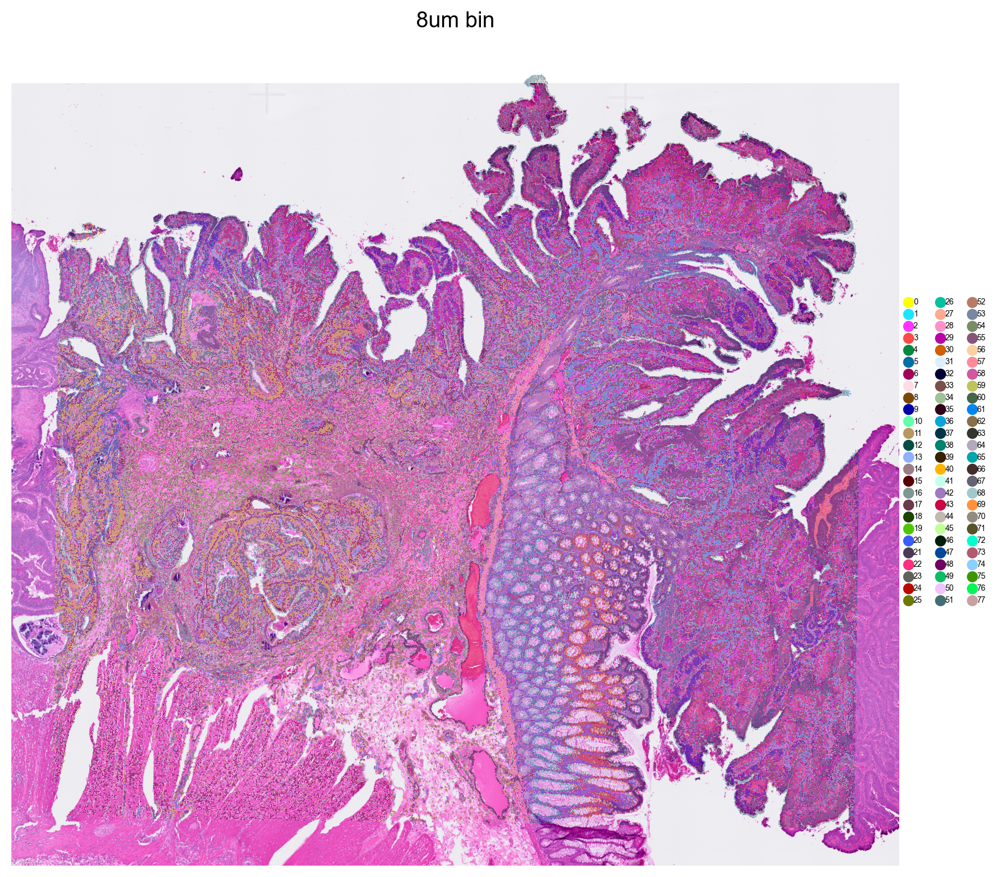

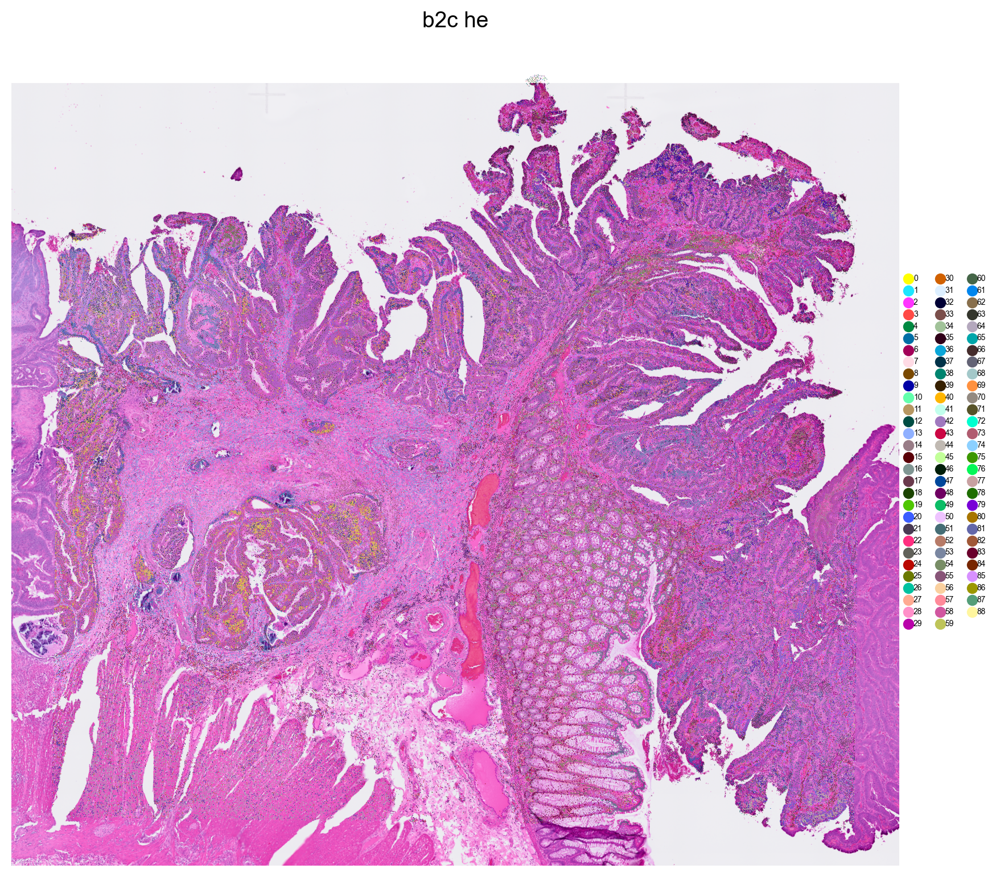

In [16]:
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
plt.set_loglevel('WARNING')

#
# Confidence threshold
conf_th = 0

# Set figure parameters
sc.set_figure_params(dpi=100, dpi_save=2000, figsize=[10, 10], format='jpg')

# Plot for 8um bin
sc.pl.spatial(bdata, color='leiden',
              title='8um bin', size=20, img_key='hires', legend_fontsize=5,
              spot_size=1, frameon=False, )

# Plot for b2c he
sc.pl.spatial(cdata, color='leiden', 
              title='b2c he', size=20, img_key='hires', legend_fontsize=5,
              spot_size=1, frameon=False, )


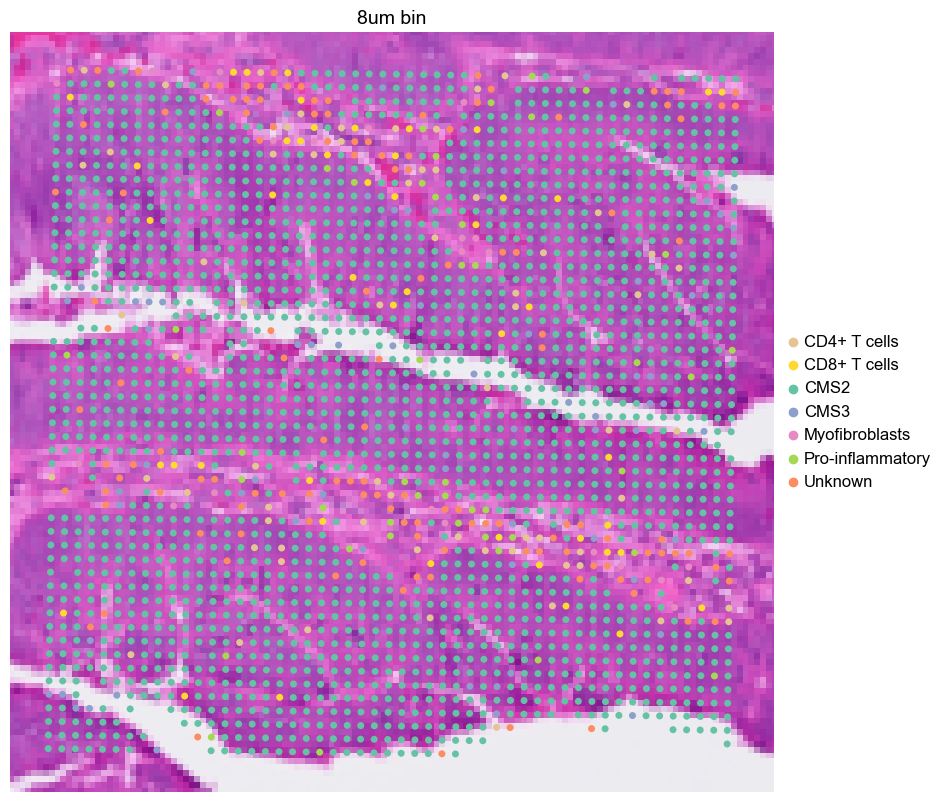

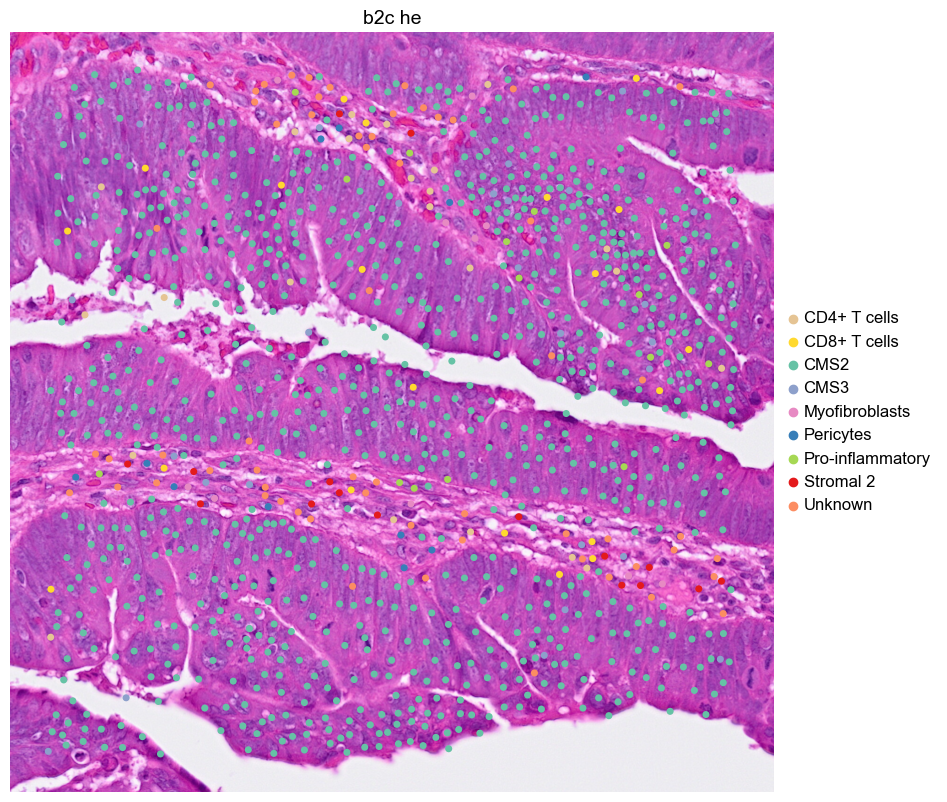

In [17]:
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
plt.set_loglevel('WARNING')

# Confidence threshold
conf_th = 0.01
mask_thr = [1900, 2100, 2400, 2600]

# Define a mask to easily pull out this region of the object /4 is to account for 8um column data as opposed to b2c which is in the original 2um col data system 
bmask = ((bdata.obs['array_row'] >= mask_thr[0]/4) & 
         (bdata.obs['array_row'] <= mask_thr[1]/4) & 
         (bdata.obs['array_col'] >= mask_thr[2]/4) & 
         (bdata.obs['array_col'] <= mask_thr[3]/4))

# Define a mask to easily pull out this region of the object
cmask = ((cdata.obs['array_row'] >= mask_thr[0]) & 
         (cdata.obs['array_row'] <= mask_thr[1]) & 
         (cdata.obs['array_col'] >= mask_thr[2]) & 
         (cdata.obs['array_col'] <= mask_thr[3]))

# Set figure parameters
sc.set_figure_params(dpi=50, dpi_save=300, figsize=[10, 10], format='pdf')

# Filter data based on the masks and confidence threshold
temp_bdata = bdata[bmask]
temp_bdata = temp_bdata[temp_bdata.obs['conf_score'] > conf_th]

temp_cdata = cdata[cmask]
temp_cdata = temp_cdata[temp_cdata.obs['conf_score'] > conf_th]

# Filter out label types with fewer than 20 members in bdata
b_label_counts = temp_bdata.obs['predicted_labels'].value_counts()
b_labels_to_keep = b_label_counts[b_label_counts >= 20].index
temp_bdata = temp_bdata[temp_bdata.obs['predicted_labels'].isin(b_labels_to_keep)]

# Filter out label types with fewer than 10 members in cdata
c_label_counts = temp_cdata.obs['predicted_labels'].value_counts()
c_labels_to_keep = c_label_counts[c_label_counts >= 10].index
temp_cdata = temp_cdata[temp_cdata.obs['predicted_labels'].isin(c_labels_to_keep)]

# Get unique labels from both datasets
b_labels = set(temp_bdata.obs['predicted_labels'].unique())
c_labels = set(temp_cdata.obs['predicted_labels'].unique())

# Create sets of mutual and unique labels
mutual_labels = b_labels & c_labels
unique_b_labels = b_labels - mutual_labels
unique_c_labels = c_labels - mutual_labels

# Ensure enough unique colors by combining multiple palettes if necessary
mutual_palette = sns.color_palette("Set2", len(mutual_labels))
unique_b_palette = sns.color_palette("Set3", len(unique_b_labels))
unique_c_palette = sns.color_palette("Set1", len(unique_c_labels))

color_dict = {}
color_dict.update(dict(zip(mutual_labels, mutual_palette)))
color_dict.update(dict(zip(unique_b_labels, unique_b_palette)))
color_dict.update(dict(zip(unique_c_labels, unique_c_palette)))

# Plot for 8um bin with consistent colors for mutual labels
sc.pl.spatial(temp_bdata, color='predicted_labels', title='8um bin', size=20, img_key='hires', legend_fontsize=12, spot_size=0.75, frameon=False, palette=color_dict)

# Plot for b2c with consistent colors for mutual labels
sc.pl.spatial(temp_cdata, color='predicted_labels', title='b2c he', size=20, img_key='0.3_mpp', legend_fontsize=12, spot_size=0.75, frameon=False, palette=color_dict, basis='spatial_cropped')


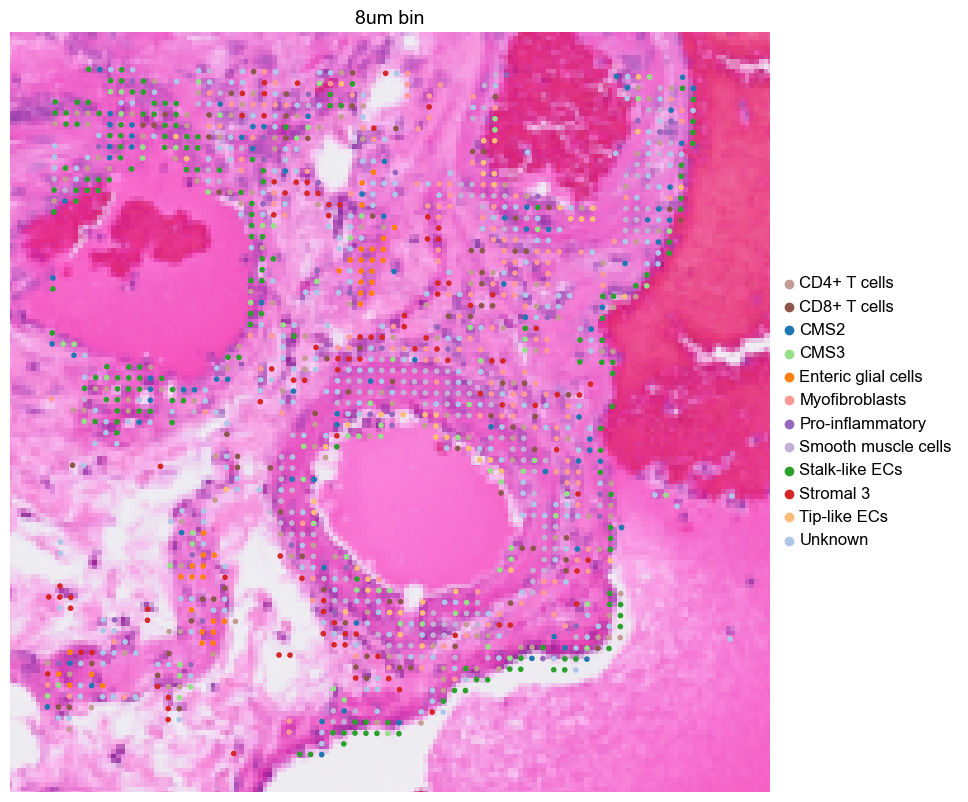

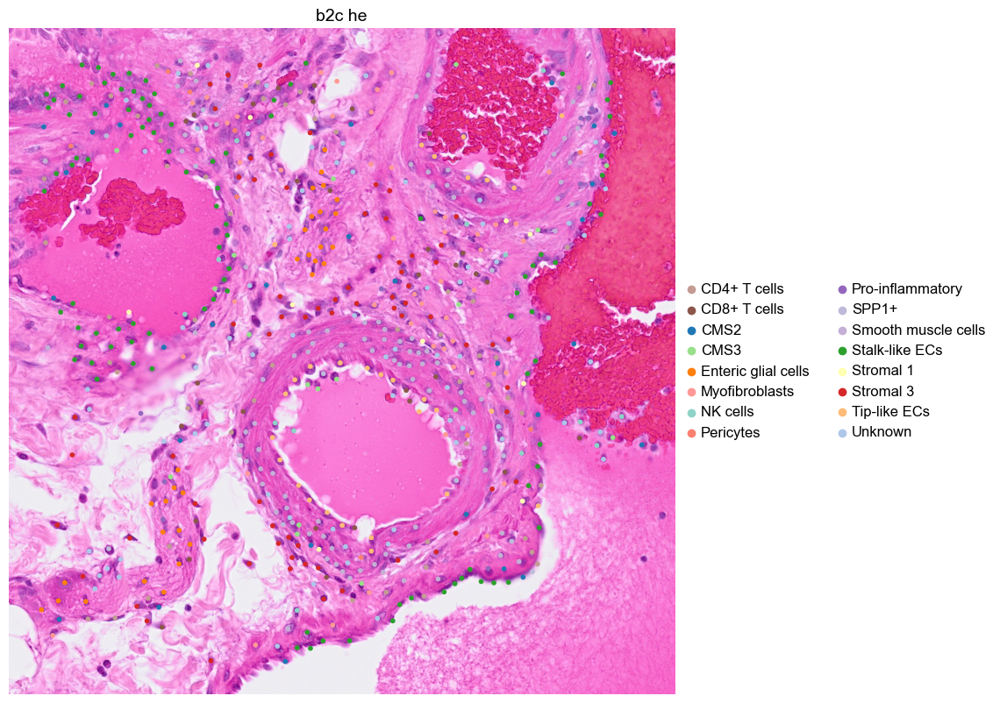

In [18]:
# region 2 

mask_thr = [500,750,1500,1750]
#define a mask to easily pull out this region of the object /4 is to account for 8um column data as oppoed to b2c which is in the original 2um col data system 
bmask = ((bdata.obs['array_row'] >= mask_thr[0]/4) & 
        (bdata.obs['array_row'] <= mask_thr[1]/4) & 
        (bdata.obs['array_col'] >= mask_thr[2]/4) & 
        (bdata.obs['array_col'] <= mask_thr[3]/4))

#define a mask to easily pull out this region of the object
cmask = ((cdata.obs['array_row'] >= mask_thr[0]) & 
        (cdata.obs['array_row'] <= mask_thr[1]) & 
        (cdata.obs['array_col'] >= mask_thr[2]) & 
        (cdata.obs['array_col'] <= mask_thr[3]))


# Set figure parameters
sc.set_figure_params(dpi=50, dpi_save=300, figsize=[10, 10], format='pdf')

# Filter data based on the masks and confidence threshold
temp_bdata = bdata[bmask]
temp_bdata = temp_bdata[temp_bdata.obs['conf_score'] > conf_th]

temp_cdata = cdata[cmask]
temp_cdata = temp_cdata[temp_cdata.obs['conf_score'] > conf_th]

# Filter out label types with fewer than 20 members in bdata
b_label_counts = temp_bdata.obs['predicted_labels'].value_counts()
b_labels_to_keep = b_label_counts[b_label_counts >= 20].index
temp_bdata = temp_bdata[temp_bdata.obs['predicted_labels'].isin(b_labels_to_keep)]

# Filter out label types with fewer than 10 members in cdata
c_label_counts = temp_cdata.obs['predicted_labels'].value_counts()
c_labels_to_keep = c_label_counts[c_label_counts >= 10].index
temp_cdata = temp_cdata[temp_cdata.obs['predicted_labels'].isin(c_labels_to_keep)]

# Get unique labels from both datasets
b_labels = set(temp_bdata.obs['predicted_labels'].unique())
c_labels = set(temp_cdata.obs['predicted_labels'].unique())

# Create sets of mutual and unique labels
mutual_labels = b_labels & c_labels
unique_b_labels = b_labels - mutual_labels
unique_c_labels = c_labels - mutual_labels

# Ensure enough unique colors by combining multiple palettes if necessary
mutual_palette = sns.color_palette("tab20", len(mutual_labels))
unique_b_palette = sns.color_palette("Set1", len(unique_b_labels))
unique_c_palette = sns.color_palette("Set3", len(unique_c_labels))

color_dict = {}
color_dict.update(dict(zip(mutual_labels, mutual_palette)))
color_dict.update(dict(zip(unique_b_labels, unique_b_palette)))
color_dict.update(dict(zip(unique_c_labels, unique_c_palette)))

# Plot for 8um bin with consistent colors for mutual labels
sc.pl.spatial(temp_bdata, color='predicted_labels', title='8um bin', size=20, img_key='hires', legend_fontsize=12, spot_size=0.75, frameon=False,  palette=color_dict)

# Plot for b2c with consistent colors for mutual labels
sc.pl.spatial(temp_cdata, color='predicted_labels', title='b2c he', size=20, img_key='0.3_mpp', legend_fontsize=12, spot_size=0.75, frameon=False, palette=color_dict, basis='spatial_cropped')